Importing the Necessary Modules

In [1]:
import pandas as pd
from sqlalchemy import create_engine
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import pyplot
import random
import json
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.graph_objects as go

Connecting to the Database

In [2]:
db_username_0 = 'simulationuser'
db_password_0 = 'simulations2024'
db_host_0 = 'localhost'
db_port_0 = '5432'
db_name_0 = 'simulations_data'
table_name_0 = 'composite_data'

In [3]:
connection_string = f"postgresql://{db_username_0}:{db_password_0}@{db_host_0}:{db_port_0}/{db_name_0}"
engine = create_engine(connection_string)
query = f"SELECT * FROM {table_name_0}"
df = pd.read_sql(query, engine)

The DataFrame

In [4]:
df.head()

,id,eps,n_0_squared,psi_e,b_e,psi_plus,b_plus,u_list,r_list,k_e_psi_e_list,k_e_b_e_list,k_e_psi_plus_list,k_e_b_plus_list,heat_flux_psi_e_b_e_list,heat_flux_psi_e_b_plus_list,b_e_psi_plus_list,b_e_b_plus_list,psi_plus_b_plus_list,eta_list
0,1500,0.123943,318.864022,"[-0.011744609035812982, -0.011215305626181015,...","[-5.517162102724528, -3.1920707854231463, -0.9...","[-0.0016475367466768115, -0.002355776502265530...","[10.73076649947905, 10.77581128940965, 10.5402...","[0.4615413218450946, 0.4686702377764153, 0.478...","[0.6551578220909112, 0.8945764375320215, 1.175...","[0.00013793584140409996, 0.0001257830802886475...","[30.43907766773974, 10.189315899151941, 0.8663...","[2.7143773316504123e-06, 5.549682928626416e-06...","[115.14934966634185, 116.11810894496844, 111.0...","[0.06479691188370344, 0.035800049438924265, 0....","[-0.1260286571909809, -0.12085401698078094, -0...","[0.009089727301611367, 0.007519805349868124, 0...","[-59.203378264111755, -34.39715240615747, -9.8...","[-0.01767933212790023, -0.025385403028438877, ...","[[1.0369206541904592], [-1.6813054180526377], ..."
1,1501,0.123943,318.864022,"[-0.008147157474100065, -0.008292099833020762,...","[-0.832904729882089, 0.14071461474575664, 1.27...","[0.0006807256129005129, 0.0007313699095774325,...","[-0.7190970906032216, -0.6095182673572732, -0....","[0.23703131704960073, 0.23479400902756253, 0.2...","[-0.18778048603775238, -0.2053401462453807, -0...","[6.637617490778455e-05, 6.875891964078295e-05,...","[0.6937302890599556, 0.019800602803046713, 1.6...","[4.6338736005877887e-07, 5.349019446353018e-07...","[0.5171006257140178, 0.3715125182422124, 0.293...","[0.006785805995272157, -0.0011668196334368695,...","[0.005858597236311648, 0.005054186322976349, 0...","[-0.0005669795827367211, 0.0001029144350628272...","[0.5989393680078723, -0.0857681281716798, -0.6...","[-0.0004895078077358536, -0.000445783320082882...","[[1.418213787060706], [0.8827834628841255], [0..."
2,1502,0.123943,318.864022,"[-0.003781434990007615, -0.001308768972368787,...","[7.429632504232679, 7.616174400779771, 7.45893...","[0.0017201097552821953, 0.0016973192181066884,...","[0.26192796713213556, -0.016191321040263613, -...","[0.3398928494975913, 0.33847860008307173, 0.33...","[-0.22023434840890527, -0.0752140155360062, 0....","[1.4299250583653892e-05, 1.7128762230352505e-0...","[55.199439147950756, 58.00611250309311, 55.635...","[2.958777570216974e-06, 2.8808925281543e-06, 2...","[0.06860625996597308, 0.0002621588770288832, 0...","[-0.028094672314403355, -0.009967812743890003,...","[-0.000990463579775022, 2.1190698599158928e-05...","[0.012779783348692317, 0.012927079178895698, 0...","[1.9460285383725033, -0.12331592482166262, -2....","[0.00045054485144522063, -2.7481840368174608e-...","[[-0.6679438799496836], [-0.8041216677662598],..."
3,1503,0.123943,318.864022,"[-0.008102021680746106, -0.007577287179778589,...","[-13.405475487140006, -12.142974722866745, -10...","[-0.007065355563569785, -0.007211423776971252,...","[3.432058579711073, 2.9279736455346024, 2.4210...","[0.15021463519080008, 0.17082991418834997, 0.1...","[1.9382048681079675, 1.850150346137473, 2.4148...","[6.564275531527996e-05, 5.7415281004836965e-05...","[179.70677303631157, 147.4518351201807, 119.05...","[4.991924923966652e-05, 5.2004632891066315e-05...","[11.779026094568387, 8.573029668945189, 5.8616...","[0.10861145303751879, 0.09201080669195365, 0.1...","[-0.0278066130224098, -0.022186097167038923, -...","[0.09471445081536302, 0.08756813663964214, 0.0...","[-46.00837716074533, -35.55430996694667, -26.4...","[-0.024248714180659044, -0.021114858765753426,...","[[0.20668630436664126], [1.0343110874926529], ..."
4,1504,0.123943,318.864022,"[-0.0007052290130828054, -0.003475921446700475...","[7.188510348955567, 7.255315274332748, 7.40112...","[0.01155266108186768, 0.011468163968599393, 0....","[-0.9665805895951766, 0.23618988496103174, 1.4...","[0.1388431307750241, 0.13278906064134477, 0.12...","[-0.2758572865676108, -1.349696442983

Space Plots


In [5]:
import pandas as pd
import numpy as np

def _ensure_list(x):
    # If your DB returned strings like "[1,2,3]", turn them into lists.
    if isinstance(x, str):
        import json
        return json.loads(x)
    return x

def to_long_events(df, dt=0.001, stride=10, sample_events=None, max_points=400_000):
    """
    df: table you loaded from Postgres (one row per reversal)
    dt: original simulation dt
    stride: take every `stride`th point within each event (you downsampled by 10 in sim; keep or change)
    sample_events: if set, randomly sample this many events to plot
    max_points: hard cap to keep plotting fast
    """
    # Optionally sample events to keep volumes sane
    if sample_events is not None and len(df) > sample_events:
        df = df.sample(sample_events, random_state=0)

    long_frames = []
    total = 0

    for eid, row in df.iterrows():
        psi_e = _ensure_list(row["psi_e"])
        b_e   = _ensure_list(row["b_e"])
        psi_p = _ensure_list(row["psi_plus"])
        b_p   = _ensure_list(row["b_plus"])
        U     = _ensure_list(row["u_list"])

        n = len(U)
        if not (len(psi_e)==len(b_e)==len(psi_p)==len(b_p)==n):
            continue  # skip malformed rows

        # indices within this event
        ix = np.arange(0, n, stride)
        center = n // 2                               # reversal index (arrays are symmetric around the switch)
        tau = (ix - center) * dt * stride            # time relative to switch (seconds)
        phase = np.where(ix < center, "before", "after")

        sub = pd.DataFrame({
            "event_id": eid,
            "t_idx": ix,
            "tau": tau,
            "phase": phase,
            "psi_e": np.asarray(psi_e)[ix],
            "b_e":   np.asarray(b_e)[ix],
            "psi_p": np.asarray(psi_p)[ix],
            "b_p":   np.asarray(b_p)[ix],
            "U":     np.asarray(U)[ix],
        })
        long_frames.append(sub)
        total += len(ix)
        if total >= max_points:
            break

    return pd.concat(long_frames, ignore_index=True) if long_frames else pd.DataFrame()


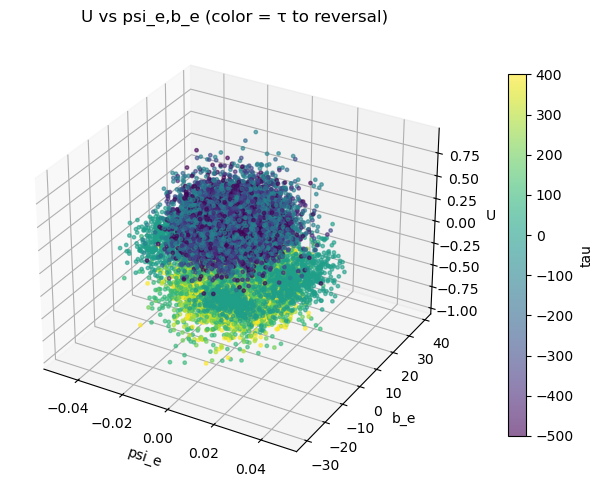

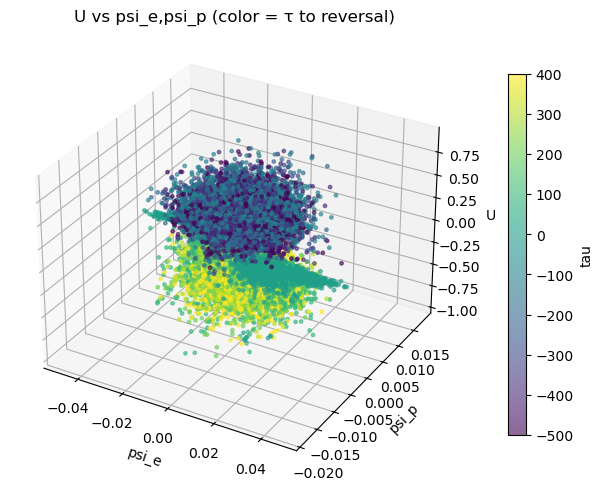

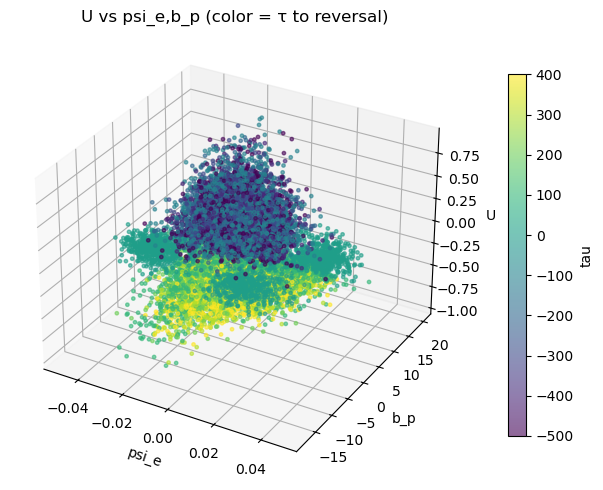

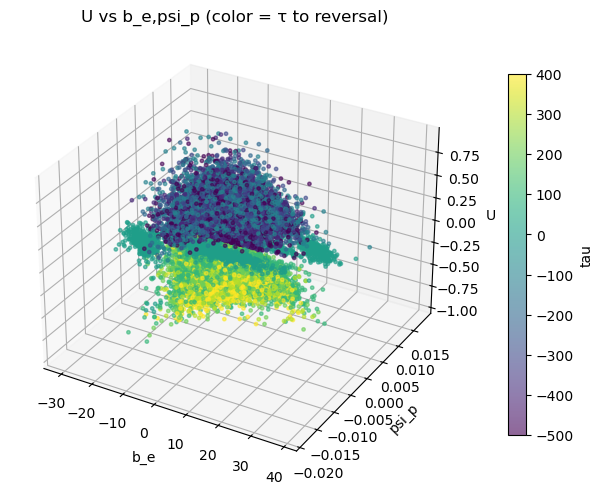

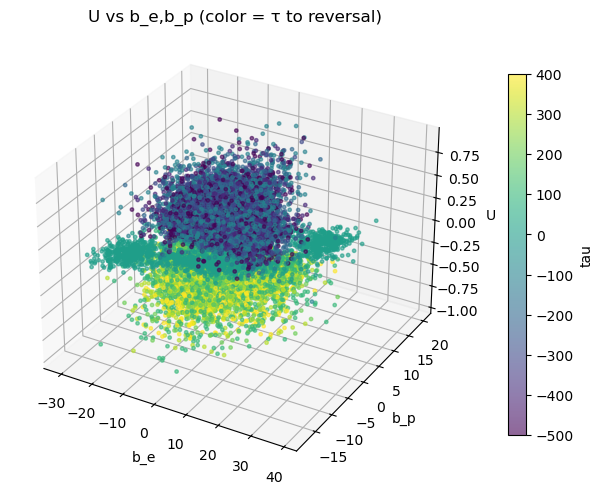

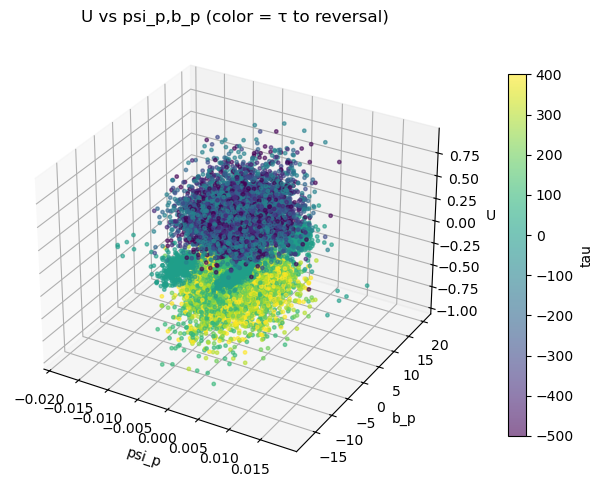

In [6]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

def plot_3d(df_long, x, y, z="U", color_by="tau", title=None):
    fig = plt.figure(figsize=(7,5))
    ax = fig.add_subplot(111, projection="3d")
    cvals = df_long[color_by] if color_by else "C0"
    sc = ax.scatter(df_long[x], df_long[y], df_long[z], c=cvals, s=6, alpha=0.6)
    ax.set_xlabel(x); ax.set_ylabel(y); ax.set_zlabel(z)
    if title: ax.set_title(title)
    if color_by:
        cb = fig.colorbar(sc, ax=ax, fraction=0.03, pad=0.08)
        cb.set_label(color_by)
    plt.tight_layout(); plt.show()

pairs = [("psi_e","b_e"), ("psi_e","psi_p"), ("psi_e","b_p"),
         ("b_e","psi_p"), ("b_e","b_p"), ("psi_p","b_p")]

# Build long table (tune stride/sample to taste)
df_long = to_long_events(df, dt=0.01, stride=100, sample_events=2000, max_points=300_000)

for x,y in pairs:
    plot_3d(df_long, x, y, z="U", color_by="tau", title=f"U vs {x},{y} (color = τ to reversal)")


In [7]:
import json
import numpy as np
import pandas as pd
# import plotly.express as px  # (optional; not used below)
import plotly.graph_objects as go
from pathlib import Path

def _ensure_list(x):
    # Convert strings like "[1,2,3]" -> Python lists
    if isinstance(x, str):
        return json.loads(x)
    return x

def to_long_events(
    df,
    dt=0.01,
    stride=10,
    sample_events=None,
    max_points=300_000,
    window_sec=1.0,
    exclude_center_sec=0.0,   # cut out (-exclude_center_sec, +exclude_center_sec)
    window_left_sec=None,     # optional asymmetric outer windows
    window_right_sec=None
):
    """
    df: one row per reversal; columns: psi_e, b_e, psi_plus, b_plus, u_list, (optionally) id
    dt: simulation time step (seconds)
    stride: downsample factor inside each event
    sample_events: randomly sample this many events to keep plots fast (None = use all)
    max_points: hard cap on total rows across events
    window_sec: half-width of the outer window if asymmetric values aren't provided
    exclude_center_sec: half-width of the inner gap to exclude around the reversal (0 = no gap)
    window_left_sec/window_right_sec: optional asymmetric outer half-widths; if None, use window_sec
    """
    if sample_events is not None and len(df) > sample_events:
        df = df.sample(sample_events, random_state=0)

    # Resolve symmetric/asymmetric outer windows
    L = float(window_left_sec if window_left_sec is not None else window_sec)
    R = float(window_right_sec if window_right_sec is not None else window_sec)
    gap = max(0.0, float(exclude_center_sec))

    # If the gap eats the whole window on either side, clamp to keep at least one sample window
    if gap >= max(L, R):
        # nothing would remain; shrink gap slightly
        gap = 0.99 * max(L, R)

    frames, total = [], 0
    left_outer_steps  = int(L / dt)
    right_outer_steps = int(R / dt)
    inner_gap_steps   = int(gap / dt)

    # Ensure we have a stable event id source
    has_id_col = "id" in df.columns

    for i, (_, row) in enumerate(df.iterrows()):
        event_id = int(row["id"]) if has_id_col else int(i)

        psi_e = np.asarray(_ensure_list(row["psi_e"]))
        b_e   = np.asarray(_ensure_list(row["b_e"]))
        psi_p = np.asarray(_ensure_list(row["psi_plus"]))
        b_p   = np.asarray(_ensure_list(row["b_plus"]))
        U     = np.asarray(_ensure_list(row["u_list"]))

        n = len(U)
        if not (len(psi_e)==len(b_e)==len(psi_p)==len(b_p)==n):
            continue

        center = n // 2  # reversal index (assumed midpoint)

        # Compute outer and inner bounds (clamped to [0, n))
        left_start  = max(0, center - left_outer_steps)
        left_end    = max(0, min(n, center - inner_gap_steps))     # stop before the gap
        right_start = min(n, max(0, center + inner_gap_steps))     # start after the gap
        right_end   = min(n, center + right_outer_steps)

        # Build indices on each side, with downsampling stride
        left_idx  = np.arange(left_start, left_end, stride)  if left_end > left_start  else np.array([], dtype=int)
        right_idx = np.arange(right_start, right_end, stride) if right_end > right_start else np.array([], dtype=int)

        # Concatenate. If gap == 0, left_end == center and right_start == center -> continuous window.
        idx = np.concatenate([left_idx, right_idx])
        if idx.size == 0:
            continue

        tau = (idx - center) * dt
        phase = np.where(idx < center, "before", "after")

        sub = pd.DataFrame({
            "event_id": event_id,
            "t_idx": idx,
            "tau": tau,
            "phase": phase.astype(str),
            "psi_e": psi_e[idx],
            "b_e":   b_e[idx],
            "psi_p": psi_p[idx],
            "b_p":   b_p[idx],
            "U":     U[idx],
        })
        frames.append(sub)
        total += len(sub)
        if total >= max_points:
            break

    return pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()


# --- Build long table: keep [-2, -0.5] and [0.5, 2]
df_long = to_long_events(
    df,
    dt=0.01,
    stride=1,
    sample_events=200,      # adjust as you like
    max_points=300_000,
    window_sec=5,        # outer half-window
    exclude_center_sec=0 # inner half-gap
)

print(df_long.shape, df_long.columns.tolist())

# --- Plotly 3D scatter for all 6 pairs. Color by tau (or switch to "phase")
pairs = [
    ("psi_e","b_e"),
    ("psi_e","psi_p"),
    ("psi_e","b_p"),
    ("b_e","psi_p"),
    ("b_e","b_p"),
    ("psi_p","b_p"),
]

outdir = Path("plotly_3d_pairs"); outdir.mkdir(exist_ok=True)

for x, y in pairs:
    fig = go.Figure()

    for eid, sub in df_long.groupby("event_id"):
        sub = sub.sort_values("tau")  # order points in time
        fig.add_trace(go.Scatter3d(
            x=sub[x], y=sub[y], z=sub["U"],
            mode="lines+markers",
            line=dict(width=2),
            marker=dict(size=3, color=sub["tau"], colorscale="Viridis", showscale=False),
            name=f"event {eid}"
        ))

    fig.update_layout(
        title=f"U vs {x}, {y} — trajectory lines",
        scene=dict(xaxis_title=x, yaxis_title=y, zaxis_title="U"),
        template="simple_white",
        margin=dict(l=0, r=0, t=40, b=0)
    )

    html_path = outdir / f"U_vs_{x}_{y}_lines.html"
    fig.write_html(str(html_path))
    print(f"Saved {html_path}")


(200000, 9) ['event_id', 't_idx', 'tau', 'phase', 'psi_e', 'b_e', 'psi_p', 'b_p', 'U']
Saved plotly_3d_pairs/U_vs_psi_e_b_e_lines.html
Saved plotly_3d_pairs/U_vs_psi_e_psi_p_lines.html
Saved plotly_3d_pairs/U_vs_psi_e_b_p_lines.html
Saved plotly_3d_pairs/U_vs_b_e_psi_p_lines.html
Saved plotly_3d_pairs/U_vs_b_e_b_p_lines.html
Saved plotly_3d_pairs/U_vs_psi_p_b_p_lines.html


In [9]:
import json
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from pathlib import Path

def _ensure_list(x):
    if isinstance(x, str):
        return json.loads(x)
    return x

def to_long_events_midpoint_with_inner_window(
    df: pd.DataFrame,
    dt: float = 0.01,
    stride: int = 1,
    sample_events: int | None = None,
    max_points: int = 300_000,
    # outer extraction range in seconds
    outer_left_sec: float = 1.0,
    outer_right_sec: float = 1.0,
    # inner highlight (red) range in seconds
    inner_left_sec: float = 0.2,
    inner_right_sec: float = 0.2,
):
    """
    Assumes reversal at midpoint n//2 for each event.
    Keeps all points in [center-outer_left, center+outer_right].
    Flags in_window=True only for [center-inner_left, center+inner_right].
    """
    if sample_events is not None and len(df) > sample_events:
        df = df.sample(sample_events, random_state=0)

    # clamp to nonnegative
    L0 = max(0.0, float(outer_left_sec))
    R0 = max(0.0, float(outer_right_sec))
    L1 = max(0.0, float(inner_left_sec))
    R1 = max(0.0, float(inner_right_sec))

    # make sure inner ≤ outer
    L1 = min(L1, L0)
    R1 = min(R1, R0)

    out_left_steps  = int(np.floor(L0 / dt))
    out_right_steps = int(np.floor(R0 / dt))

    has_id_col = "id" in df.columns
    frames, total = [], 0

    for i, (_, row) in enumerate(df.iterrows()):
        event_id = int(row["id"]) if has_id_col else int(i)

        psi_e = np.asarray(_ensure_list(row["psi_e"]))
        b_e   = np.asarray(_ensure_list(row["b_e"]))
        psi_p = np.asarray(_ensure_list(row["psi_plus"]))
        b_p   = np.asarray(_ensure_list(row["b_plus"]))
        U     = np.asarray(_ensure_list(row["u_list"]))

        n = len(U)
        if not (len(psi_e)==len(b_e)==len(psi_p)==len(b_p)==n):
            continue

        center = n // 2  # midpoint reversal

        left_start  = max(0, center - out_left_steps)
        right_end   = min(n, center + out_right_steps)

        idx = np.arange(left_start, right_end, stride, dtype=int)
        if idx.size == 0:
            continue

        tau = (idx - center) * dt

        # inner red window
        in_window = (tau >= -L1) & (tau <= R1)

        sub = pd.DataFrame({
            "event_id": event_id,
            "t_idx": idx,
            "tau": tau,
            "in_window": in_window.astype(bool),
            "psi_e": psi_e[idx],
            "b_e":   b_e[idx],
            "psi_p": psi_p[idx],
            "b_p":   b_p[idx],
            "U":     U[idx],
        })
        frames.append(sub)
        total += len(sub)
        if total >= max_points:
            break

    return pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()


# -------- Example use --------
df_long = to_long_events_midpoint_with_inner_window(
    df,
    dt=0.01,
    stride=1,
    sample_events=50,
    max_points=300_000,
    outer_left_sec=5.0,   # show ±1.0 s around reversal
    outer_right_sec=5.0,
    inner_left_sec=5,   # highlight ±0.2 s
    inner_right_sec=5,
)

pairs = [
    ("psi_e","b_e"),
    ("psi_e","psi_p"),
    ("psi_e","b_p"),
    ("b_e","psi_p"),
    ("b_e","b_p"),
    ("psi_p","b_p"),
]

outdir = Path("plotly_3d_pairs_seconds"); outdir.mkdir(exist_ok=True)
RED  = "rgba(220, 20, 60, 1.0)"
GREY = "rgba(128, 128, 128, .65)"

for x, y in pairs:
    fig = go.Figure()

    for eid, sub in df_long.groupby("event_id", sort=False):
        sub = sub.sort_values("tau")

        win = sub[sub["in_window"]]
        if not win.empty:
            fig.add_trace(go.Scatter3d(
                x=win[x], y=win[y], z=win["U"],
                mode="lines+markers",
                line=dict(width=3, color=RED),
                marker=dict(size=3, color=RED),
                name=f"event {eid} — window",
                showlegend=True
            ))

        ctx = sub[~sub["in_window"]]
        if not ctx.empty:
            fig.add_trace(go.Scatter3d(
                x=ctx[x], y=ctx[y], z=ctx["U"],
                mode="lines+markers",
                line=dict(width=3, color=GREY),
                marker=dict(size=2, color=GREY),
                name=f"event {eid} — context",
                showlegend=True
            ))

    fig.update_layout(
        title=f"U vs {x}, {y} — red ±{0.2}s inside grey ±{1.0}s",
        scene=dict(xaxis_title=x, yaxis_title=y, zaxis_title="U"),
        template="simple_white",
        margin=dict(l=0, r=0, t=40, b=0)
    )

    fig.write_html(str(outdir / f"U_vs_{x}_{y}_seconds.html"))


In [8]:
import numpy as np, pandas as pd, plotly.graph_objects as go
from sklearn.neighbors import KNeighborsRegressor

def surface_U(df_long, x, y, z="U", ngrid=60, overlay_points=False, title=None):
    # Fit U = f(x,y)
    X = df_long[[x,y]].values
    yvec = df_long[z].values
    # KNN smoother (robust + minimal tuning). Increase n_neighbors for smoother surface.
    knn = KNeighborsRegressor(n_neighbors=35, weights="distance").fit(X, yvec)

    # grid over central 2–98% to avoid outliers stretching axes
    xg = np.linspace(df_long[x].quantile(0.02), df_long[x].quantile(0.98), ngrid)
    yg = np.linspace(df_long[y].quantile(0.02), df_long[y].quantile(0.98), ngrid)
    XX, YY = np.meshgrid(xg, yg)
    ZZ = knn.predict(np.c_[XX.ravel(), YY.ravel()]).reshape(XX.shape)

    surf = go.Surface(x=XX, y=YY, z=ZZ, colorscale="Viridis", showscale=True, opacity=0.95)

    fig = go.Figure(data=[surf])
    if overlay_points:
        # ultra-light reference points (thin sample)
        samp = df_long.sample(min(1500, len(df_long)), random_state=0)
        fig.add_trace(go.Scatter3d(
            x=samp[x], y=samp[y], z=samp[z],
            mode="markers", marker=dict(size=2, opacity=0.25), name="samples"
        ))

    fig.update_layout(
        title=title or f"Smooth surface: U({x}, {y})",
        scene=dict(
            xaxis_title=x, yaxis_title=y, zaxis_title="U",
            xaxis=dict(showbackground=False, gridcolor="rgba(0,0,0,0.1)"),
            yaxis=dict(showbackground=False, gridcolor="rgba(0,0,0,0.1)"),
            zaxis=dict(showbackground=False, gridcolor="rgba(0,0,0,0.1)")
        ),
        template="simple_white",
        margin=dict(l=0, r=0, t=40, b=0),
    )
    return fig

# Example:
# fig = surface_U(df_long, "psi_p", "b_p", overlay_points=False, title="±1s around reversal")
# fig.show()


In [9]:
import plotly.express as px

def heatmap_U(df_long, x, y, z="U", nbins=60, title=None):
    # Mean U per (x,y) bin
    hm = px.density_heatmap(
        df_long, x=x, y=y, z=z, histfunc="avg",
        nbinsx=nbins, nbinsy=nbins,
        color_continuous_scale="Viridis",
        title=title or f"Mean U across {x}–{y} (±1s window)"
    )
    # Add density contours for structure
    ct = px.density_contour(df_long, x=x, y=y, nbins=12)
    for tr in ct.data:
        tr.showlegend = False
        tr.line.width = 1
        hm.add_trace(tr)

    hm.update_layout(template="simple_white")
    return hm

# Example:
# fig = heatmap_U(df_long, "psi_p", "b_p")
# fig.show()


In [10]:
import plotly.express as px

def heatmap_U(df_long, x, y, z="U", nbins=60, title=None):
    # Mean U per (x,y) bin
    hm = px.density_heatmap(
        df_long, x=x, y=y, z=z, histfunc="avg",
        nbinsx=nbins, nbinsy=nbins,
        color_continuous_scale="Viridis",
        title=title or f"Mean U across {x}–{y} (±1s window)"
    )
    # Add density contours for structure
    ct = px.density_contour(df_long, x=x, y=y, nbins=12)
    for tr in ct.data:
        tr.showlegend = False
        tr.line.width = 1
        hm.add_trace(tr)

    hm.update_layout(template="simple_white")
    return hm

# Example:
# fig = heatmap_U(df_long, "psi_p", "b_p")
# fig.show()


In [11]:
import plotly.express as px

def clean_scatter3d(df_long, x, y, z="U", color="phase", sample=8000, title=None):
    if len(df_long) > sample:
        data = df_long.sample(sample, random_state=0)
    else:
        data = df_long

    fig = px.scatter_3d(
        data, x=x, y=y, z=z, color=color,
        opacity=0.6, title=title or f"U vs {x}, {y}",
    )
    fig.update_traces(marker=dict(size=2))
    fig.update_layout(
        template="simple_white",
        scene=dict(
            xaxis=dict(showbackground=False, gridcolor="rgba(0,0,0,0.08)"),
            yaxis=dict(showbackground=False, gridcolor="rgba(0,0,0,0.08)"),
            zaxis=dict(showbackground=False, gridcolor="rgba(0,0,0,0.08)"),
        ),
        margin=dict(l=0, r=0, t=40, b=0)
    )
    return fig

# Example:
# fig = clean_scatter3d(df_long, "psi_p", "b_p")
# fig.show()


In [12]:
pairs = [("psi_e","b_e"), ("psi_e","psi_p"), ("psi_e","b_p"),
         ("b_e","psi_p"), ("b_e","b_p"), ("psi_p","b_p")]

# A) Surfaces
# for x,y in pairs:
#     fig = surface_U(df_long, x, y, overlay_points=False, title=f"U({x},{y}) — ±1s")
#     fig.write_html(f"surface_U_{x}_{y}.html")

# B) 2D mean-U heatmaps
for x,y in pairs:
    fig = heatmap_U(df_long, x, y, nbins=60, title=f"Mean U over {x}–{y} — ±1s")
    fig.write_html(f"heatmap_U_{x}_{y}.html")

# C) Clean scatters
# for x,y in pairs:
#     fig = clean_scatter3d(df_long, x, y, title=f"Scatter: U vs {x},{y} — ±1s")
#     fig.write_html(f"scatter3d_U_{x}_{y}.html")


TypeError: density_contour() got an unexpected keyword argument 'nbins'

Verifying Details

In [ ]:
def length_of_the_first_entry(series):
    return len(series.iloc[0])

selected_columns = df.iloc[:,3:]

lengths = selected_columns.apply(length_of_the_first_entry)
lengths

psi_e                          1000
b_e                            1000
psi_plus                       1000
b_plus                         1000
u_list                         1000
r_list                         1000
k_e_psi_e_list                 1000
k_e_b_e_list                   1000
k_e_psi_plus_list              1000
k_e_b_plus_list                1000
heat_flux_psi_e_b_e_list       1000
heat_flux_psi_e_b_plus_list    1000
b_e_psi_plus_list              1000
b_e_b_plus_list                1000
psi_plus_b_plus_list           1000
eta_list                       1000
dtype: int64

Defining Common Functions

In [ ]:
def average_arrays(*arrays):
    if not arrays:
        raise ValueError("No arrays provided for averaging.")
    
    np_arrays = [np.array(arr) for arr in arrays]
    array_lengths = [len(arr) for arr in np_arrays]

    if len(set(array_lengths)) != 1:
        raise ValueError("All input arrays must have the same length.")
    
    average_array = np.mean(np_arrays, axis=0)
    
    return average_array

Composite Analysis of All the Data

In [ ]:
average_psi_e = average_arrays(*list(df['psi_e']))
average_b_e = average_arrays(*list(df['b_e']))
average_psi_plus = average_arrays(*list(df['psi_plus']))
average_b_plus = average_arrays(*list(df['b_plus']))
average_U = average_arrays(*list(df['u_list']))
average_R = average_arrays(*list(df['r_list']))
average_k_e_psi_e_list = average_arrays(*list(df['k_e_psi_e_list']))
average_k_e_b_e_list = average_arrays(*list(df['k_e_b_e_list']))
average_k_e_psi_plus_list = average_arrays(*list(df['k_e_psi_plus_list']))
average_k_e_b_plus_list = average_arrays(*list(df['k_e_b_plus_list']))
average_heat_flux_psi_e_b_e_list = average_arrays(*list(df['heat_flux_psi_e_b_e_list']))
average_heat_flux_psi_e_b_plus_list = average_arrays(*list(df['heat_flux_psi_e_b_plus_list']))
average_b_e_psi_plus_list = average_arrays(*list(df['b_e_psi_plus_list']))
average_b_e_b_plus_list = average_arrays(*list(df['b_e_b_plus_list']))
average_psi_plus_b_plus_list = average_arrays(*list(df['psi_plus_b_plus_list']))
average_eta = average_arrays(*list(df['eta_list']))

In [ ]:
window_size = 5000
dt = .001
epsilon = 0.12394270273516043
N_0_squared = 318.8640217310387

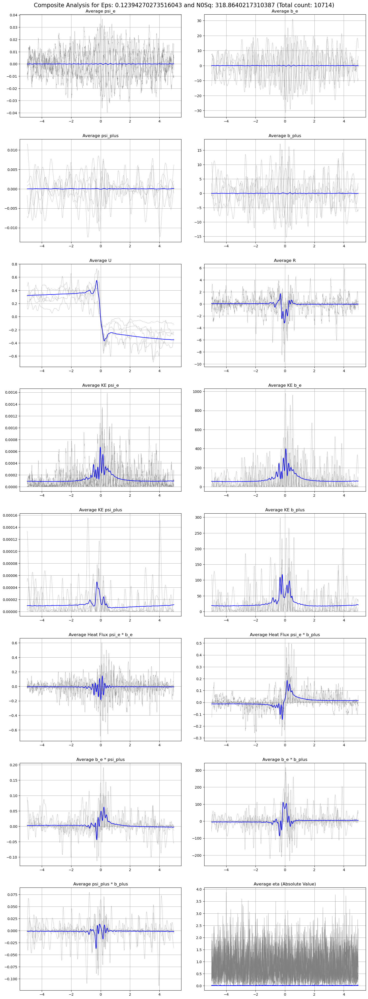

In [ ]:
time_array = np.arange(-window_size/10, window_size/10) * dt * 10

fig, axs = plt.subplots(8, 2, figsize=(15, 40))

for i in range(5):
    axs[0, 0].plot(time_array, df['psi_e'][i], linewidth=0.5, linestyle='--', color='gray')
axs[0, 0].plot(time_array, average_psi_e, label='Average', linewidth=1.5, color='blue')
axs[0, 0].set_title(f'Average psi_e')
axs[0, 0].grid()


for i in range(5):
    axs[0, 1].plot(time_array, df['b_e'][i], linewidth=0.5, linestyle='--', color='gray')
axs[0, 1].plot(time_array, average_b_e, label='Average', linewidth=1.5, color='blue')
axs[0, 1].set_title(f'Average b_e')
axs[0, 1].grid()

for i in range(5):
    axs[1, 0].plot(time_array, df['psi_plus'][i],linewidth=0.5, linestyle='--', color='gray') 
axs[1, 0].plot(time_array, average_psi_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 0].set_title(f'Average psi_plus')
axs[1, 0].grid()

for i in range(5):
    axs[1, 1].plot(time_array, df['b_plus'][i], linewidth=0.5, linestyle='--', color='gray')
axs[1, 1].plot(time_array, average_b_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 1].set_title(f'Average b_plus')
axs[1, 1].grid()

for i in range(5):
    axs[2, 0].plot(time_array, df['u_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[2, 0].plot(time_array, average_U, label='Average', linewidth=1.5, color='blue')
axs[2, 0].set_title(f'Average U')
axs[2, 0].grid()

for i in range(5):
    axs[2, 1].plot(time_array, df['r_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[2, 1].plot(time_array, average_R, label='Average', linewidth=1.5, color='blue')
axs[2, 1].set_title(f'Average R')
axs[2, 1].grid()

for i in range(5):
    axs[3, 0].plot(time_array, df['k_e_psi_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[3, 0].plot(time_array, average_k_e_psi_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 0].set_title(f'Average KE psi_e')
axs[3, 0].grid()

for i in range(5):
    axs[3, 1].plot(time_array, df['k_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[3, 1].plot(time_array, average_k_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 1].set_title(f'Average KE b_e')
axs[3, 1].grid()

for i in range(5):
    axs[4, 0].plot(time_array, df['k_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[4, 0].plot(time_array, average_k_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 0].set_title(f'Average KE psi_plus')
axs[4, 0].grid()

for i in range(5):
    axs[4, 1].plot(time_array, df['k_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[4, 1].plot(time_array, average_k_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 1].set_title(f'Average KE b_plus')
axs[4, 1].grid()

for i in range(5):
    axs[5, 0].plot(time_array, df['heat_flux_psi_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[5, 0].plot(time_array, average_heat_flux_psi_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[5, 0].set_title(f'Average Heat Flux psi_e * b_e')
axs[5, 0].grid()

for i in range(5):
    axs[5, 1].plot(time_array, df['heat_flux_psi_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[5, 1].plot(time_array, average_heat_flux_psi_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[5, 1].set_title(f'Average Heat Flux psi_e * b_plus')
axs[5, 1].grid()

for i in range(5):
    axs[6, 0].plot(time_array, df['b_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[6, 0].plot(time_array, average_b_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 0].set_title(f'Average b_e * psi_plus')
axs[6, 0].grid()

for i in range(5):
    axs[6, 1].plot(time_array, df['b_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[6, 1].plot(time_array, average_b_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 1].set_title(f'Average b_e * b_plus')
axs[6, 1].grid()

for i in range(5):
    axs[7, 0].plot(time_array, df['psi_plus_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[7, 0].plot(time_array, average_psi_plus_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[7, 0].set_title(f'Average psi_plus * b_plus')
axs[7, 0].grid()

average_eta = [[abs(i) for i in sublist] for sublist in average_eta]

for i in range(5): #Check if the average eta is the same using randn 
    axs[7, 1].plot(time_array, [abs(i[0]) for i in df['eta_list'][i]], linewidth=0.5, linestyle='-', label=f'eta_list {i}', color = 'gray')
axs[7, 1].plot(time_array, [abs(i[0]) for i in average_eta], label='Average', linewidth=1.5, color='blue')
axs[7, 1].set_title('Average eta (Absolute Value)')
axs[7, 1].grid()


plt.suptitle(f'Composite Analysis for Eps: {epsilon} and N0Sq: {N_0_squared} (Total count: {len(list(df['b_e']))})', fontsize=16)
plt.subplots_adjust(wspace=0.3, hspace=0.3, top=1.85)

plt.tight_layout(pad = 3)

plt.show()

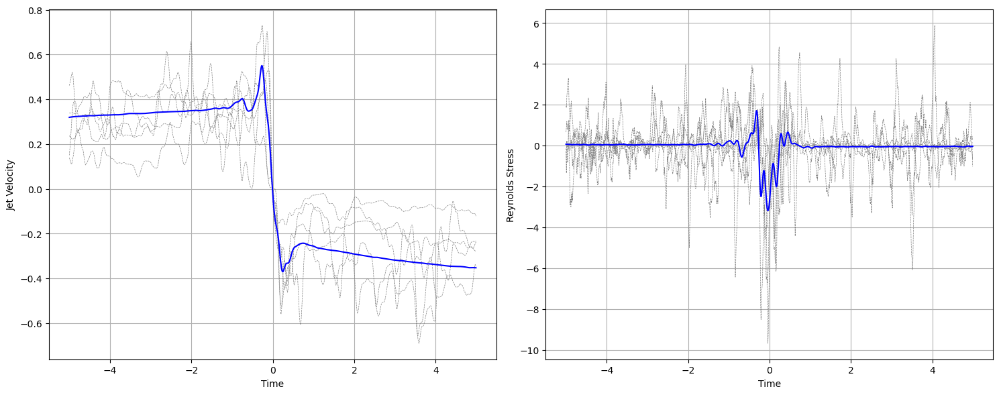

In [ ]:
time_array = np.arange(-window_size/10, window_size/10) * dt * 10

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# for i in range(5):
#     axs[0, 0].plot(time_array, df['psi_e'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[0, 0].plot(time_array, average_psi_e, label='Average', linewidth=1.5, color='blue')
# axs[0, 0].set_title(f'Average psi_e')
# axs[0, 0].grid()


# for i in range(5):
#     axs[0, 1].plot(time_array, df['b_e'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[0, 1].plot(time_array, average_b_e, label='Average', linewidth=1.5, color='blue')
# axs[0, 1].set_title(f'Average b_e')
# axs[0, 1].grid()

# for i in range(5):
#     axs[1, 0].plot(time_array, df['psi_plus'][i],linewidth=0.5, linestyle='--', color='gray') 
# axs[1, 0].plot(time_array, average_psi_plus, label='Average', linewidth=1.5, color='blue')
# axs[1, 0].set_title(f'Average psi_plus')
# axs[1, 0].grid()

# for i in range(5):
#     axs[1, 1].plot(time_array, df['b_plus'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[1, 1].plot(time_array, average_b_plus, label='Average', linewidth=1.5, color='blue')
# axs[1, 1].set_title(f'Average b_plus')
# axs[1, 1].grid()

for i in range(5):
    axs[0].plot(time_array, df['u_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[0].plot(time_array, average_U, label='Average', linewidth=1.5, color='blue')
# axs[0].set_title(f'Average U')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Jet Velocity')
axs[0].grid()

for i in range(5):
    axs[1].plot(time_array, df['r_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[1].plot(time_array, average_R, label='Average', linewidth=1.5, color='blue')
# axs[1].set_title(f'Average R')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Reynolds Stress')
axs[1].grid()

# for i in range(5):
#     axs[3, 0].plot(time_array, df['k_e_psi_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[3, 0].plot(time_array, average_k_e_psi_e_list, label='Average', linewidth=1.5, color='blue')
# axs[3, 0].set_title(f'Average KE psi_e')
# axs[3, 0].grid()

# for i in range(5):
#     axs[3, 1].plot(time_array, df['k_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[3, 1].plot(time_array, average_k_e_b_e_list, label='Average', linewidth=1.5, color='blue')
# axs[3, 1].set_title(f'Average KE b_e')
# axs[3, 1].grid()

# for i in range(5):
#     axs[4, 0].plot(time_array, df['k_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[4, 0].plot(time_array, average_k_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[4, 0].set_title(f'Average KE psi_plus')
# axs[4, 0].grid()

# for i in range(5):
#     axs[4, 1].plot(time_array, df['k_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[4, 1].plot(time_array, average_k_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[4, 1].set_title(f'Average KE b_plus')
# axs[4, 1].grid()

# for i in range(5):
#     axs[5, 0].plot(time_array, df['heat_flux_psi_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[5, 0].plot(time_array, average_heat_flux_psi_e_b_e_list, label='Average', linewidth=1.5, color='blue')
# axs[5, 0].set_title(f'Average Heat Flux psi_e * b_e')
# axs[5, 0].grid()

# for i in range(5):
#     axs[5, 1].plot(time_array, df['heat_flux_psi_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[5, 1].plot(time_array, average_heat_flux_psi_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[5, 1].set_title(f'Average Heat Flux psi_e * b_plus')
# axs[5, 1].grid()

# for i in range(5):
#     axs[6, 0].plot(time_array, df['b_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[6, 0].plot(time_array, average_b_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[6, 0].set_title(f'Average b_e * psi_plus')
# axs[6, 0].grid()

# for i in range(5):
#     axs[6, 1].plot(time_array, df['b_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[6, 1].plot(time_array, average_b_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[6, 1].set_title(f'Average b_e * b_plus')
# axs[6, 1].grid()

# for i in range(5):
#     axs[7, 0].plot(time_array, df['psi_plus_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[7, 0].plot(time_array, average_psi_plus_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[7, 0].set_title(f'Average psi_plus * b_plus')
# axs[7, 0].grid()

# average_eta = [[abs(i) for i in sublist] for sublist in average_eta]

# for i in range(5): #Check if the average eta is the same using randn 
#     axs[7, 1].plot(time_array, [abs(i[0]) for i in df['eta_list'][i]], linewidth=0.5, linestyle='-', label=f'eta_list {i}', color = 'gray')
# axs[7, 1].plot(time_array, [abs(i[0]) for i in average_eta], label='Average', linewidth=1.5, color='blue')
# axs[7, 1].set_title('Average eta (Absolute Value)')
# axs[7, 1].grid()


# plt.suptitle(f'Composite Analysis for Eps: {epsilon} and N0Sq: {N_0_squared} (Total count: {len(list(df['b_e']))})', fontsize=16)
# plt.subplots_adjust(wspace=0.3, hspace=0.3, top=1.85)

plt.tight_layout()

plt.show()

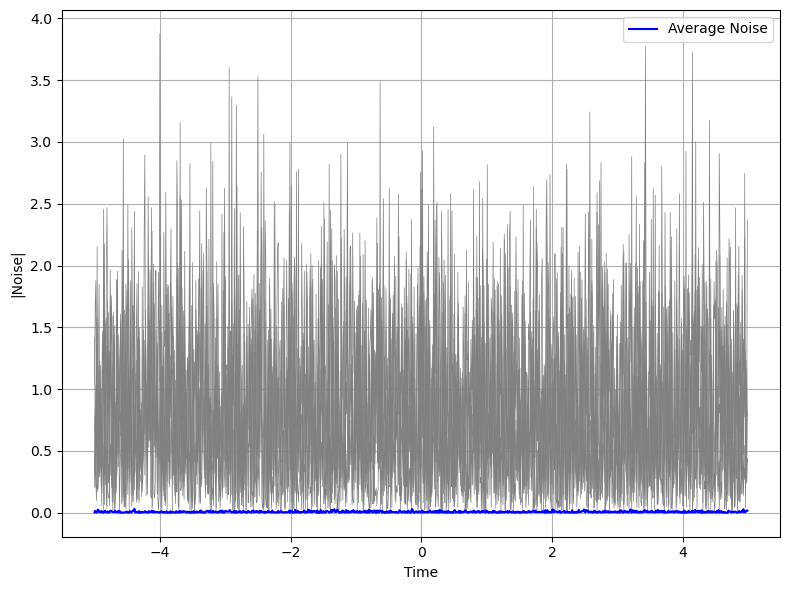

In [ ]:
time_array = np.arange(-window_size/10, window_size/10) * dt * 10

fig, axs = plt.subplots(1, 1, figsize=(8,6))

# for i in range(5):
#     axs[0, 0].plot(time_array, df['psi_e'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[0, 0].plot(time_array, average_psi_e, label='Average', linewidth=1.5, color='blue')
# axs[0, 0].set_title(f'Average psi_e')
# axs[0, 0].grid()


# for i in range(5):
#     axs[0, 1].plot(time_array, df['b_e'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[0, 1].plot(time_array, average_b_e, label='Average', linewidth=1.5, color='blue')
# axs[0, 1].set_title(f'Average b_e')
# axs[0, 1].grid()

# for i in range(5):
#     axs[1, 0].plot(time_array, df['psi_plus'][i],linewidth=0.5, linestyle='--', color='gray') 
# axs[1, 0].plot(time_array, average_psi_plus, label='Average', linewidth=1.5, color='blue')
# axs[1, 0].set_title(f'Average psi_plus')
# axs[1, 0].grid()

# for i in range(5):
#     axs[1, 1].plot(time_array, df['b_plus'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[1, 1].plot(time_array, average_b_plus, label='Average', linewidth=1.5, color='blue')
# axs[1, 1].set_title(f'Average b_plus')
# axs[1, 1].grid()

# for i in range(5):
#     axs.plot(time_array, df['u_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs.plot(time_array, average_U, label='Average', linewidth=1.5, color='blue')
# # axs[0].set_title(f'Average U')
# axs.set_xlabel('Time')
# axs.set_ylabel('Jet Velocity')
# axs.grid()



# for i in range(5):
#     axs[3, 0].plot(time_array, df['k_e_psi_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[3, 0].plot(time_array, average_k_e_psi_e_list, label='Average', linewidth=1.5, color='blue')
# axs[3, 0].set_title(f'Average KE psi_e')
# axs[3, 0].grid()

# for i in range(5):
#     axs[3, 1].plot(time_array, df['k_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[3, 1].plot(time_array, average_k_e_b_e_list, label='Average', linewidth=1.5, color='blue')
# axs[3, 1].set_title(f'Average KE b_e')
# axs[3, 1].grid()

# for i in range(5):
#     axs[4, 0].plot(time_array, df['k_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[4, 0].plot(time_array, average_k_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[4, 0].set_title(f'Average KE psi_plus')
# axs[4, 0].grid()

# for i in range(5):
#     axs[4, 1].plot(time_array, df['k_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[4, 1].plot(time_array, average_k_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[4, 1].set_title(f'Average KE b_plus')
# axs[4, 1].grid()

# for i in range(5):
#     axs[5, 0].plot(time_array, df['heat_flux_psi_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[5, 0].plot(time_array, average_heat_flux_psi_e_b_e_list, label='Average', linewidth=1.5, color='blue')
# axs[5, 0].set_title(f'Average Heat Flux psi_e * b_e')
# axs[5, 0].grid()

# for i in range(5):
#     axs[5, 1].plot(time_array, df['heat_flux_psi_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[5, 1].plot(time_array, average_heat_flux_psi_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[5, 1].set_title(f'Average Heat Flux psi_e * b_plus')
# axs[5, 1].grid()

# for i in range(5):
#     axs[6, 0].plot(time_array, df['b_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[6, 0].plot(time_array, average_b_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[6, 0].set_title(f'Average b_e * psi_plus')
# axs[6, 0].grid()

# for i in range(5):
#     axs[6, 1].plot(time_array, df['b_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[6, 1].plot(time_array, average_b_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[6, 1].set_title(f'Average b_e * b_plus')
# axs[6, 1].grid()

# for i in range(5):
#     axs[7, 0].plot(time_array, df['psi_plus_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
# axs[7, 0].plot(time_array, average_psi_plus_b_plus_list, label='Average', linewidth=1.5, color='blue')
# axs[7, 0].set_title(f'Average psi_plus * b_plus')
# axs[7, 0].grid()

average_eta = [[abs(i) for i in sublist] for sublist in average_eta]

for i in range(5): #Check if the average eta is the same using randn 
    axs.plot(time_array, [abs(i[0]) for i in df['eta_list'][i]], linewidth=0.5, linestyle='-', color = 'gray')
axs.plot(time_array, [abs(i[0]) for i in average_eta], label='Average Noise', linewidth=1.5, color='blue')
# axs.set_title('Average eta (Absolute Value)')
axs.set_xlabel('Time')
axs.set_ylabel('|Noise|')
axs.grid()


# plt.suptitle(f'Composite Analysis for Eps: {epsilon} and N0Sq: {N_0_squared} (Total count: {len(list(df['b_e']))})', fontsize=16)
# plt.subplots_adjust(wspace=0.3, hspace=0.3, top=1.85)
plt.legend()
plt.tight_layout()

plt.show()

Verifying the result by splitting

In [ ]:
df = df.sample(frac=1).reset_index(drop=True)

half_index = len(df) // 2
df1 = df.iloc[:half_index]
df2 = df.iloc[half_index:]

In [ ]:
df1.describe(include='all')

,id,eps,n_0_squared,psi_e,b_e,psi_plus,b_plus,u_list,r_list,k_e_psi_e_list,k_e_b_e_list,k_e_psi_plus_list,k_e_b_plus_list,heat_flux_psi_e_b_e_list,heat_flux_psi_e_b_plus_list,b_e_psi_plus_list,b_e_b_plus_list,psi_plus_b_plus_list,eta_list
count,5357.000000,5.357000e+03,5.357000e+03,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357
unique,NaN,NaN,NaN,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357
top,NaN,NaN,NaN,"[0.017450812342783718, 0.017817013406502675, 0...","[-4.771905928351965, -7.05927662163023, -9.108...","[-0.0019430250935725756, -0.001748966819182755...","[-3.097216691217699, -2.8877166256367346, -2.5...","[0.37390005409890964, 0.3624767029029283, 0.35...","[-1.1480645691506406, -1.0550881211484495, -0....","[0.0003045308514230525, 0.00031744596672749604...","[22.77108618904063, 49.833386420695106, 82.967...","[3.775346514252716e-06, 3.0588849346022445e-06...","[9.592751232357513, 8.33890730997881, 6.359168...","[-0.08327363487308727, -0.12577522620779671, -...","[-0.05404894726337757, -0.051450485833150365, ...","[0.009271932962955606, 0.01234644057866381, 0....","[14.779626690212396, 20.385190465250336, 22.96...","[0.0060179697512678125, 0.005050520561441039, ...","[[-0.10982540097972017], [0.3141928920127013],..."
freq,NaN,NaN,NaN,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
mean,6860.352436,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,3095.620735,3.788990e-15,2.251210e-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1500.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,4207.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,6878.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,9543.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df2.describe(include='all')

,id,eps,n_0_squared,psi_e,b_e,psi_plus,b_plus,u_list,r_list,k_e_psi_e_list,k_e_b_e_list,k_e_psi_plus_list,k_e_b_plus_list,heat_flux_psi_e_b_e_list,heat_flux_psi_e_b_plus_list,b_e_psi_plus_list,b_e_b_plus_list,psi_plus_b_plus_list,eta_list
count,5357.000000,5.357000e+03,5.357000e+03,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357
unique,NaN,NaN,NaN,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357,5357
top,NaN,NaN,NaN,"[0.004554022988299187, 0.005692157012809854, -...","[-3.0817398336769637, -3.8988809914124456, -4....","[0.0015990424054066518, 0.0019819951340544475,...","[-6.029768169104479, -5.5333649069634046, -4.9...","[0.34566256518557, 0.347819611435916, 0.348693...","[0.24656274479958315, 0.38198975175376965, -0....","[2.0739125377957456e-05, 3.24006514584804e-05,...","[9.49712040247132, 15.201272985197294, 20.1970...","[2.556936614288691e-06, 3.928304711415508e-06,...","[36.35810417314558, 30.618127193614125, 24.451...","[-0.014034314046522205, -0.022193042777379386,...","[-0.027459702856216496, -0.031496781859607685,...","[-0.004927832676480307, -0.0077275631532368475...","[18.582176754566685, 21.573931254308313, 22.22...","[-0.009641854997169288, -0.01096710232054911, ...","[[-0.865736395668849], [0.6239837820500684], [..."
freq,NaN,NaN,NaN,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
mean,6852.647564,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,3090.680682,3.788990e-15,2.251210e-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1503.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,4147.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,6841.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,9526.000000,1.239427e-01,3.188640e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Plotting the First Half

In [ ]:
df1_average_psi_e = average_arrays(*list(df1['psi_e']))
df1_average_b_e = average_arrays(*list(df1['b_e']))
df1_average_psi_plus = average_arrays(*list(df1['psi_plus']))
df1_average_b_plus = average_arrays(*list(df1['b_plus']))
df1_average_U = average_arrays(*list(df1['u_list']))
df1_average_R = average_arrays(*list(df1['r_list']))
df1_average_k_e_psi_e_list = average_arrays(*list(df1['k_e_psi_e_list']))
df1_average_k_e_b_e_list = average_arrays(*list(df1['k_e_b_e_list']))
df1_average_k_e_psi_plus_list = average_arrays(*list(df1['k_e_psi_plus_list']))
df1_average_k_e_b_plus_list = average_arrays(*list(df1['k_e_b_plus_list']))
df1_average_heat_flux_psi_e_b_e_list = average_arrays(*list(df1['heat_flux_psi_e_b_e_list']))
df1_average_heat_flux_psi_e_b_plus_list = average_arrays(*list(df1['heat_flux_psi_e_b_plus_list']))
df1_average_b_e_psi_plus_list = average_arrays(*list(df1['b_e_psi_plus_list']))
df1_average_b_e_b_plus_list = average_arrays(*list(df1['b_e_b_plus_list']))
df1_average_psi_plus_b_plus_list = average_arrays(*list(df1['psi_plus_b_plus_list']))
df1_average_eta = average_arrays(*list(df1['eta_list']))

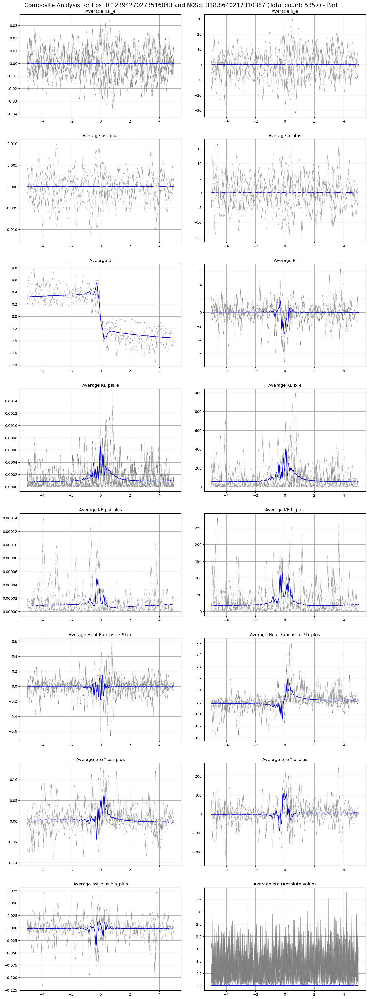

In [ ]:
time_array = np.arange(-window_size/10, window_size/10) * dt * 10

fig, axs = plt.subplots(8, 2, figsize=(15, 40))

for i in range(5):
    axs[0, 0].plot(time_array, df1['psi_e'][i], linewidth=0.5, linestyle='--', color='gray')
axs[0, 0].plot(time_array, df1_average_psi_e, label='Average', linewidth=1.5, color='blue')
axs[0, 0].set_title(f'Average psi_e')
axs[0, 0].grid()


for i in range(5):
    axs[0, 1].plot(time_array, df1['b_e'][i], linewidth=0.5, linestyle='--', color='gray')
axs[0, 1].plot(time_array, df1_average_b_e, label='Average', linewidth=1.5, color='blue')
axs[0, 1].set_title(f'Average b_e')
axs[0, 1].grid()

for i in range(5):
    axs[1, 0].plot(time_array, df1['psi_plus'][i],linewidth=0.5, linestyle='--', color='gray') 
axs[1, 0].plot(time_array, df1_average_psi_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 0].set_title(f'Average psi_plus')
axs[1, 0].grid()

for i in range(5):
    axs[1, 1].plot(time_array, df1['b_plus'][i], linewidth=0.5, linestyle='--', color='gray')
axs[1, 1].plot(time_array, df1_average_b_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 1].set_title(f'Average b_plus')
axs[1, 1].grid()

for i in range(5):
    axs[2, 0].plot(time_array, df1['u_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[2, 0].plot(time_array, df1_average_U, label='Average', linewidth=1.5, color='blue')
axs[2, 0].set_title(f'Average U')
axs[2, 0].grid()

for i in range(5):
    axs[2, 1].plot(time_array, df1['r_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[2, 1].plot(time_array, df1_average_R, label='Average', linewidth=1.5, color='blue')
axs[2, 1].set_title(f'Average R')
axs[2, 1].grid()

for i in range(5):
    axs[3, 0].plot(time_array, df1['k_e_psi_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[3, 0].plot(time_array, df1_average_k_e_psi_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 0].set_title(f'Average KE psi_e')
axs[3, 0].grid()

for i in range(5):
    axs[3, 1].plot(time_array, df1['k_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[3, 1].plot(time_array, df1_average_k_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 1].set_title(f'Average KE b_e')
axs[3, 1].grid()

for i in range(5):
    axs[4, 0].plot(time_array, df1['k_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[4, 0].plot(time_array, df1_average_k_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 0].set_title(f'Average KE psi_plus')
axs[4, 0].grid()

for i in range(5):
    axs[4, 1].plot(time_array, df1['k_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[4, 1].plot(time_array, df1_average_k_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 1].set_title(f'Average KE b_plus')
axs[4, 1].grid()

for i in range(5):
    axs[5, 0].plot(time_array, df1['heat_flux_psi_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[5, 0].plot(time_array, df1_average_heat_flux_psi_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[5, 0].set_title(f'Average Heat Flux psi_e * b_e')
axs[5, 0].grid()

for i in range(5):
    axs[5, 1].plot(time_array, df1['heat_flux_psi_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[5, 1].plot(time_array, df1_average_heat_flux_psi_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[5, 1].set_title(f'Average Heat Flux psi_e * b_plus')
axs[5, 1].grid()

for i in range(5):
    axs[6, 0].plot(time_array, df1['b_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[6, 0].plot(time_array, df1_average_b_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 0].set_title(f'Average b_e * psi_plus')
axs[6, 0].grid()

for i in range(5):
    axs[6, 1].plot(time_array, df1['b_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[6, 1].plot(time_array, df1_average_b_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 1].set_title(f'Average b_e * b_plus')
axs[6, 1].grid()

for i in range(5):
    axs[7, 0].plot(time_array, df1['psi_plus_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[7, 0].plot(time_array, df1_average_psi_plus_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[7, 0].set_title(f'Average psi_plus * b_plus')
axs[7, 0].grid()


for i in range(5):
    axs[7, 1].plot(time_array, [abs(i[0]) for i in df1['eta_list'][i]], linewidth=0.5, linestyle='-', label=f'eta_list {i}', color = 'gray')
axs[7, 1].plot(time_array, [abs(i[0]) for i in df1_average_eta], label='Average', linewidth=1.5, color='blue')
axs[7, 1].set_title('Average eta (Absolute Value)')
axs[7, 1].grid()


plt.suptitle(f'Composite Analysis for Eps: {epsilon} and N0Sq: {N_0_squared} (Total count: {len(list(df1['b_e']))}) - Part 1', fontsize=16)
plt.subplots_adjust(wspace=0.3, hspace=0.3, top=1.85)

plt.tight_layout(pad = 3)

plt.show()

Plotting the Second Half

In [ ]:
df2.reset_index(drop=True, inplace = True)

In [ ]:
df2_average_psi_e = average_arrays(*list(df2['psi_e']))
df2_average_b_e = average_arrays(*list(df2['b_e']))
df2_average_psi_plus = average_arrays(*list(df2['psi_plus']))
df2_average_b_plus = average_arrays(*list(df2['b_plus']))
df2_average_U = average_arrays(*list(df2['u_list']))
df2_average_R = average_arrays(*list(df2['r_list']))
df2_average_k_e_psi_e_list = average_arrays(*list(df2['k_e_psi_e_list']))
df2_average_k_e_b_e_list = average_arrays(*list(df2['k_e_b_e_list']))
df2_average_k_e_psi_plus_list = average_arrays(*list(df2['k_e_psi_plus_list']))
df2_average_k_e_b_plus_list = average_arrays(*list(df2['k_e_b_plus_list']))
df2_average_heat_flux_psi_e_b_e_list = average_arrays(*list(df2['heat_flux_psi_e_b_e_list']))
df2_average_heat_flux_psi_e_b_plus_list = average_arrays(*list(df2['heat_flux_psi_e_b_plus_list']))
df2_average_b_e_psi_plus_list = average_arrays(*list(df2['b_e_psi_plus_list']))
df2_average_b_e_b_plus_list = average_arrays(*list(df2['b_e_b_plus_list']))
df2_average_psi_plus_b_plus_list = average_arrays(*list(df2['psi_plus_b_plus_list']))
df2_average_eta = average_arrays(*list(df2['eta_list']))

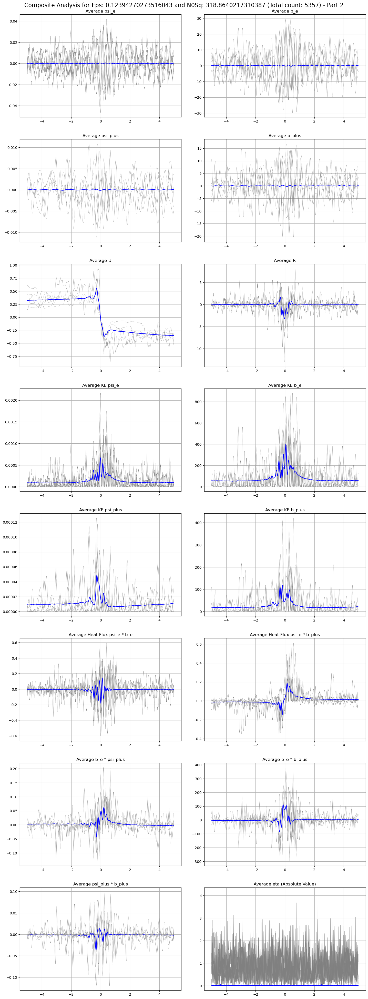

In [ ]:
time_array = np.arange(-window_size/10, window_size/10) * dt * 10

fig, axs = plt.subplots(8, 2, figsize=(15, 40))

for i in range(5):
    axs[0, 0].plot(time_array, df2['psi_e'][i], linewidth=0.5, linestyle='--', color='gray')
axs[0, 0].plot(time_array, df2_average_psi_e, label='Average', linewidth=1.5, color='blue')
axs[0, 0].set_title(f'Average psi_e')
axs[0, 0].grid()


for i in range(5):
    axs[0, 1].plot(time_array, df2['b_e'][i], linewidth=0.5, linestyle='--', color='gray')
axs[0, 1].plot(time_array, df2_average_b_e, label='Average', linewidth=1.5, color='blue')
axs[0, 1].set_title(f'Average b_e')
axs[0, 1].grid()

for i in range(5):
    axs[1, 0].plot(time_array, df2['psi_plus'][i],linewidth=0.5, linestyle='--', color='gray') 
axs[1, 0].plot(time_array, df2_average_psi_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 0].set_title(f'Average psi_plus')
axs[1, 0].grid()

for i in range(5):
    axs[1, 1].plot(time_array, df2['b_plus'][i], linewidth=0.5, linestyle='--', color='gray')
axs[1, 1].plot(time_array, df2_average_b_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 1].set_title(f'Average b_plus')
axs[1, 1].grid()

for i in range(5):
    axs[2, 0].plot(time_array, df2['u_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[2, 0].plot(time_array, df2_average_U, label='Average', linewidth=1.5, color='blue')
axs[2, 0].set_title(f'Average U')
axs[2, 0].grid()

for i in range(5):
    axs[2, 1].plot(time_array, df2['r_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[2, 1].plot(time_array, df2_average_R, label='Average', linewidth=1.5, color='blue')
axs[2, 1].set_title(f'Average R')
axs[2, 1].grid()

for i in range(5):
    axs[3, 0].plot(time_array, df2['k_e_psi_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[3, 0].plot(time_array, df2_average_k_e_psi_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 0].set_title(f'Average KE psi_e')
axs[3, 0].grid()

for i in range(5):
    axs[3, 1].plot(time_array, df2['k_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[3, 1].plot(time_array, df2_average_k_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 1].set_title(f'Average KE b_e')
axs[3, 1].grid()

for i in range(5):
    axs[4, 0].plot(time_array, df2['k_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[4, 0].plot(time_array, df2_average_k_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 0].set_title(f'Average KE psi_plus')
axs[4, 0].grid()

for i in range(5):
    axs[4, 1].plot(time_array, df2['k_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[4, 1].plot(time_array, df2_average_k_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 1].set_title(f'Average KE b_plus')
axs[4, 1].grid()

for i in range(5):
    axs[5, 0].plot(time_array, df2['heat_flux_psi_e_b_e_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[5, 0].plot(time_array, df2_average_heat_flux_psi_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[5, 0].set_title(f'Average Heat Flux psi_e * b_e')
axs[5, 0].grid()

for i in range(5):
    axs[5, 1].plot(time_array, df2['heat_flux_psi_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[5, 1].plot(time_array, df2_average_heat_flux_psi_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[5, 1].set_title(f'Average Heat Flux psi_e * b_plus')
axs[5, 1].grid()

for i in range(5):
    axs[6, 0].plot(time_array, df2['b_e_psi_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[6, 0].plot(time_array, df2_average_b_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 0].set_title(f'Average b_e * psi_plus')
axs[6, 0].grid()

for i in range(5):
    axs[6, 1].plot(time_array, df2['b_e_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[6, 1].plot(time_array, df2_average_b_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 1].set_title(f'Average b_e * b_plus')
axs[6, 1].grid()

for i in range(5):
    axs[7, 0].plot(time_array, df2['psi_plus_b_plus_list'][i], linewidth=0.5, linestyle='--', color='gray')
axs[7, 0].plot(time_array, df2_average_psi_plus_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[7, 0].set_title(f'Average psi_plus * b_plus')
axs[7, 0].grid()

average_eta = [[abs(i) for i in sublist] for sublist in average_eta]

for i in range(5):
    axs[7, 1].plot(time_array, [abs(i[0]) for i in df2['eta_list'][i]], linewidth=0.5, linestyle='-', label=f'eta_list {i}', color = 'gray')
axs[7, 1].plot(time_array, [abs(i[0]) for i in df2_average_eta], label='Average', linewidth=1.5, color='blue')
axs[7, 1].set_title('Average eta (Absolute Value)')
axs[7, 1].grid()


plt.suptitle(f'Composite Analysis for Eps: {epsilon} and N0Sq: {N_0_squared} (Total count: {len(list(df2['b_e']))}) - Part 2', fontsize=16)
plt.subplots_adjust(wspace=0.3, hspace=0.3, top=1.85)

plt.tight_layout(pad = 3)

plt.show()

Plotting the composites on the same axes

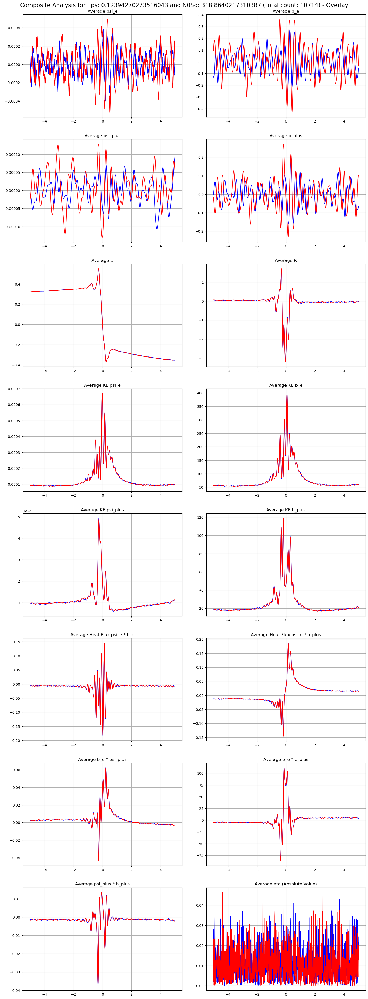

In [ ]:
time_array = np.arange(-window_size/10, window_size/10) * dt * 10

fig, axs = plt.subplots(8, 2, figsize=(15, 40))

axs[0, 0].plot(time_array, df1_average_psi_e, label='Average', linewidth=1.5, color='blue')
axs[0, 0].plot(time_array, df2_average_psi_e, label='Average', linewidth=1.5, color='red')
axs[0, 0].set_title(f'Average psi_e')
axs[0, 0].grid()


axs[0, 1].plot(time_array, df1_average_b_e, label='Average', linewidth=1.5, color='blue')
axs[0, 1].plot(time_array, df2_average_b_e, label='Average', linewidth=1.5, color='red')
axs[0, 1].set_title(f'Average b_e')
axs[0, 1].grid()

axs[1, 0].plot(time_array, df1_average_psi_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 0].plot(time_array, df2_average_psi_plus, label='Average', linewidth=1.5, color='red')
axs[1, 0].set_title(f'Average psi_plus')
axs[1, 0].grid()

axs[1, 1].plot(time_array, df1_average_b_plus, label='Average', linewidth=1.5, color='blue')
axs[1, 1].plot(time_array, df2_average_b_plus, label='Average', linewidth=1.5, color='red')
axs[1, 1].set_title(f'Average b_plus')
axs[1, 1].grid()

axs[2, 0].plot(time_array, df1_average_U, label='Average', linewidth=1.5, color='blue')
axs[2, 0].plot(time_array, df2_average_U, label='Average', linewidth=1.5, color='red')
axs[2, 0].set_title(f'Average U')
axs[2, 0].grid()

axs[2, 1].plot(time_array, df1_average_R, label='Average', linewidth=1.5, color='blue')
axs[2, 1].plot(time_array, df2_average_R, label='Average', linewidth=1.5, color='red')
axs[2, 1].set_title(f'Average R')
axs[2, 1].grid()

axs[3, 0].plot(time_array, df1_average_k_e_psi_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 0].plot(time_array, df2_average_k_e_psi_e_list, label='Average', linewidth=1.5, color='red')
axs[3, 0].set_title(f'Average KE psi_e')
axs[3, 0].grid()

axs[3, 1].plot(time_array, df1_average_k_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[3, 1].plot(time_array, df2_average_k_e_b_e_list, label='Average', linewidth=1.5, color='red')
axs[3, 1].set_title(f'Average KE b_e')
axs[3, 1].grid()

axs[4, 0].plot(time_array, df1_average_k_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 0].plot(time_array, df2_average_k_e_psi_plus_list, label='Average', linewidth=1.5, color='red')
axs[4, 0].set_title(f'Average KE psi_plus')
axs[4, 0].grid()

axs[4, 1].plot(time_array, df1_average_k_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[4, 1].plot(time_array, df2_average_k_e_b_plus_list, label='Average', linewidth=1.5, color='red')
axs[4, 1].set_title(f'Average KE b_plus')
axs[4, 1].grid()

axs[5, 0].plot(time_array, df1_average_heat_flux_psi_e_b_e_list, label='Average', linewidth=1.5, color='blue')
axs[5, 0].plot(time_array, df2_average_heat_flux_psi_e_b_e_list, label='Average', linewidth=1.5, color='red')
axs[5, 0].set_title(f'Average Heat Flux psi_e * b_e')
axs[5, 0].grid()

axs[5, 1].plot(time_array, df1_average_heat_flux_psi_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[5, 1].plot(time_array, df2_average_heat_flux_psi_e_b_plus_list, label='Average', linewidth=1.5, color='red')
axs[5, 1].set_title(f'Average Heat Flux psi_e * b_plus')
axs[5, 1].grid()

axs[6, 0].plot(time_array, df1_average_b_e_psi_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 0].plot(time_array, df2_average_b_e_psi_plus_list, label='Average', linewidth=1.5, color='red')
axs[6, 0].set_title(f'Average b_e * psi_plus')
axs[6, 0].grid()

axs[6, 1].plot(time_array, df1_average_b_e_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[6, 1].plot(time_array, df2_average_b_e_b_plus_list, label='Average', linewidth=1.5, color='red')
axs[6, 1].set_title(f'Average b_e * b_plus')
axs[6, 1].grid()

axs[7, 0].plot(time_array, df1_average_psi_plus_b_plus_list, label='Average', linewidth=1.5, color='blue')
axs[7, 0].plot(time_array, df2_average_psi_plus_b_plus_list, label='Average', linewidth=1.5, color='red')
axs[7, 0].set_title(f'Average psi_plus * b_plus')
axs[7, 0].grid()

average_eta = [[abs(i) for i in sublist] for sublist in average_eta]

axs[7, 1].plot(time_array, [abs(i[0]) for i in df1_average_eta], label='Average', linewidth=1.5, color='blue')
axs[7, 1].plot(time_array, [abs(i[0]) for i in df2_average_eta], label='Average', linewidth=1.5, color='red')
axs[7, 1].set_title('Average eta (Absolute Value)')
axs[7, 1].grid()


plt.suptitle(f'Composite Analysis for Eps: {epsilon} and N0Sq: {N_0_squared} (Total count: {len(list(df['b_e']))}) - Overlay', fontsize=16)
plt.subplots_adjust(wspace=0.3, hspace=0.3, top=1.85)

plt.tight_layout(pad = 3)

plt.show()

Performing Clustering

In [ ]:
psi_e_total = []
b_e_total = []
psi_plus_total = []
b_plus_total = []
U_total = []
R_total = []
k_e_psi_e_total = []
k_e_b_e_total = []
k_e_psi_plus_total = []
k_e_b_plus_total = []
heat_flux_psi_e_b_e_total= []
heat_flux_psi_e_b_plus_total = []
b_e_psi_plus_total = []
b_e_b_plus_total = []
psi_plus_b_plus_total= []
eta_total = []

In [ ]:
for index, row in df.iterrows():
    psi_e_list = row['psi_e']
    b_e_list = row['b_e']
    psi_plus_list = row['psi_plus']
    b_plus_list = row['b_plus']
    U_list = row['u_list']
    R_list = row['r_list']
    k_e_psi_e_list = row['k_e_psi_e_list']
    k_e_b_e_list = row['k_e_b_e_list']
    k_e_psi_plus_list = row['k_e_psi_plus_list']
    k_e_b_plus_list = row['k_e_b_plus_list']
    heat_flux_psi_e_b_e_list= row['heat_flux_psi_e_b_e_list']
    heat_flux_psi_e_b_plus_list = row['heat_flux_psi_e_b_plus_list']
    b_e_psi_plus_list = row['b_e_psi_plus_list']
    b_e_b_plus_list = row['b_e_b_plus_list']
    psi_plus_b_plus_list= row['psi_plus_b_plus_list']
    eta_list = row['eta_list']

    psi_e_total.extend(psi_e_list)
    b_e_total.extend(b_e_list)
    psi_plus_total.extend(psi_plus_list)
    b_plus_total.extend(b_plus_list)
    U_total.extend(U_list)
    R_total.extend(R_list)
    k_e_psi_e_total.extend(k_e_psi_e_list)
    k_e_b_e_total.extend(k_e_b_e_list)
    k_e_psi_plus_total.extend(k_e_psi_plus_list)
    k_e_b_plus_total.extend(k_e_b_plus_list)
    heat_flux_psi_e_b_e_total.extend(heat_flux_psi_e_b_e_list)
    heat_flux_psi_e_b_plus_total.extend(heat_flux_psi_e_b_plus_list)
    b_e_psi_plus_total.extend(b_e_psi_plus_list)
    b_e_b_plus_total.extend(b_e_b_plus_list)
    psi_plus_b_plus_total.extend(psi_plus_b_plus_list)
    eta_total.extend(eta_list)

In [ ]:
psi_e_total = np.array(psi_e_total)
b_e_total = np.array(b_e_total)
psi_plus_total = np.array(psi_plus_total)
b_plus_total =  np.array(b_plus_total)
U_total - np.array(U_total)
R_total = np.array(R_total)
k_e_psi_e_total = np.array(k_e_psi_e_total)
k_e_b_e_total = np.array(k_e_b_e_total)
k_e_psi_plus_total = np.array(k_e_psi_plus_total)
k_e_b_plus_total = np.array(k_e_b_plus_total)
heat_flux_psi_e_b_e_total= np.array(heat_flux_psi_e_b_e_total)
heat_flux_psi_e_b_plus_total = np.array(heat_flux_psi_e_b_plus_total)
b_e_psi_plus_total = np.array(b_e_psi_plus_total)
b_e_b_plus_total = np.array(b_e_b_plus_total)
psi_plus_b_plus_total= np.array(psi_plus_b_plus_total)
eta_total = np.array(eta_total)

In [ ]:
print(len(psi_e_total))
print(len(b_e_total))
print(len(psi_plus_total))
print(len(b_plus_total))
print(len(U_total))
print(len(R_total))
print(len(k_e_psi_e_total))
print(len(k_e_b_e_total))
print(len(k_e_psi_plus_total))
print(len(k_e_b_plus_total))
print(len(heat_flux_psi_e_b_e_total))
print(len(heat_flux_psi_e_b_plus_total))
print(len(b_e_psi_plus_total))
print(len(b_e_b_plus_total))
print(len(psi_plus_b_plus_total))
print(len(eta_total))

10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000
10714000


In [ ]:
data_combined = np.column_stack((psi_e_total, b_e_total, psi_plus_total, b_plus_total, U_total, R_total, k_e_psi_e_total, k_e_b_e_total, k_e_psi_plus_total, k_e_b_plus_total, heat_flux_psi_e_b_e_total, heat_flux_psi_e_b_plus_total, b_e_psi_plus_total, b_e_b_plus_total, psi_plus_b_plus_total, eta_total))
column_names = ['psi_e_total', 'b_e_total', 'psi_plus_total', 'b_plus_total', 'U_total', 'R_total', 'k_e_psi_e_total', 'k_e_b_e_total', 'k_e_psi_plus_total', 'k_e_b_plus_total', 'heat_flux_psi_e_b_e_total', 'heat_flux_psi_e_b_plus_total', 'b_e_psi_plus_total', 'b_e_b_plus_total', 'psi_plus_b_plus_total', 'eta_total']

data_combined_df = pd.DataFrame(data_combined, columns=column_names)

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_combined_df)

# Step 3: Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(data_scaled)
clusters = kmeans.labels_

print("Cluster labels:", clusters)

data_combined_df['Cluster'] = clusters

data_combined_df.head()


Cluster labels: [1 1 1 ... 0 0 0]


,psi_e_total,b_e_total,psi_plus_total,b_plus_total,U_total,R_total,k_e_psi_e_total,k_e_b_e_total,k_e_psi_plus_total,k_e_b_plus_total,heat_flux_psi_e_b_e_total,heat_flux_psi_e_b_plus_total,b_e_psi_plus_total,b_e_b_plus_total,psi_plus_b_plus_total,eta_total,Cluster
0,0.017451,-4.771906,-0.001943,-3.097217,0.373900,-1.148065,0.000305,22.771086,0.000004,9.592751,-0.083274,-0.054049,0.009272,14.779627,0.006018,-0.109825,1
1,0.017817,-7.059277,-0.001749,-2.887717,0.362477,-1.055088,0.000317,49.833386,0.000003,8.338907,-0.125775,-0.051450,0.012346,20.385190,0.005051,0.314193,1
2,0.015658,-9.108645,-0.001572,-2.521739,0.353207,-0.833608,0.000245,82.967411,0.000002,6.359169,-0.142619,-0.039484,0.014323,22.969627,0.003965,-0.891066,1
3,0.013379,-10.963888,-0.001424,-2.022189,0.345397,-0.645293,0.000179,120.206832,0.000002,4.089250,-0.146690,-0.027056,0.015618,22.171058,0.002881,0.437075,1
4,0.009187,-12.231592,-0.001307,-1.419815,0.340377,-0.406681,0.000084,149.611848,0.000002,2.015875,-0.112368,-0.013043,0.015992,17.366600,0.001856,1.760299,1


In [ ]:

pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_scaled)
print("PCA components:")
print(pca.components_)

print("Explained variance by each component:")
print(pca.explained_variance_ratio_)


PCA components:
[[-0.00295591 -0.00205259  0.00231384  0.00126831 -0.47732672 -0.25073884
   0.35672019  0.32839374  0.00593047  0.23573064 -0.09967596  0.4566707
   0.37579188  0.21479584  0.11283003 -0.0016268 ]
 [ 0.00376254 -0.00893551  0.01186474 -0.00905286 -0.04828009  0.18341783
   0.23553914 -0.29525453  0.01335832  0.45047702  0.31018667  0.381197
  -0.34648218 -0.13128064 -0.48900881 -0.00269253]]
Explained variance by each component:
[0.107902   0.08845125]


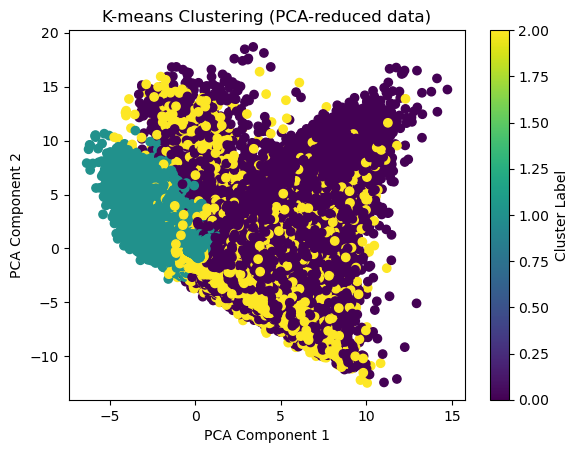

In [ ]:

plt.scatter(data_pca[:, 0], data_pca[:, 1], c=clusters, cmap='viridis', marker='o')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('K-means Clustering (PCA-reduced data)')
plt.colorbar(label='Cluster Label')
plt.show()

In [ ]:
centroids = scaler.inverse_transform(kmeans.cluster_centers_)
print("Cluster centers (original feature space):")
print(pd.DataFrame(centroids, columns=column_names))

Cluster centers (original feature space):
   psi_e_total  b_e_total  psi_plus_total  b_plus_total   U_total   R_total  \
0     0.006817  -6.130297       -0.001834      0.768665 -0.249218 -0.513348   
1     0.000354  -0.485171       -0.000168      0.052870  0.080879  0.153084   
2    -0.010653  10.784459        0.003402     -1.306454 -0.064643 -1.042877   

   k_e_psi_e_total  k_e_b_e_total  k_e_psi_plus_total  k_e_b_plus_total  \
0         0.000310     171.837064            0.000014         58.754832   
1         0.000089      51.417218            0.000009         18.632436   
2         0.000207     165.193926            0.000020         29.053402   

   heat_flux_psi_e_b_e_total  heat_flux_psi_e_b_plus_total  \
0                   0.007718                      0.083497   
1                   0.000806                     -0.008138   
2                  -0.096220                      0.012701   

   b_e_psi_plus_total  b_e_b_plus_total  psi_plus_b_plus_total  eta_total  
0            0.

In [ ]:
print("PCA components (feature importance):")
print(pd.DataFrame(pca.components_, columns=column_names))

PCA components (feature importance):
   psi_e_total  b_e_total  psi_plus_total  b_plus_total   U_total   R_total  \
0    -0.002956  -0.002053        0.002314      0.001268 -0.477327 -0.250739   
1     0.003763  -0.008936        0.011865     -0.009053 -0.048280  0.183418   

   k_e_psi_e_total  k_e_b_e_total  k_e_psi_plus_total  k_e_b_plus_total  \
0         0.356720       0.328394            0.005930          0.235731   
1         0.235539      -0.295255            0.013358          0.450477   

   heat_flux_psi_e_b_e_total  heat_flux_psi_e_b_plus_total  \
0                  -0.099676                      0.456671   
1                   0.310187                      0.381197   

   b_e_psi_plus_total  b_e_b_plus_total  psi_plus_b_plus_total  eta_total  
0            0.375792          0.214796               0.112830  -0.001627  
1           -0.346482         -0.131281              -0.489009  -0.002693  


In [ ]:
cyan_cluster_label = 1
cyan_cluster_points = data_combined_df[data_combined_df['Cluster'] == cyan_cluster_label]
cyan_cluster_points

,psi_e_total,b_e_total,psi_plus_total,b_plus_total,U_total,R_total,k_e_psi_e_total,k_e_b_e_total,k_e_psi_plus_total,k_e_b_plus_total,heat_flux_psi_e_b_e_total,heat_flux_psi_e_b_plus_total,b_e_psi_plus_total,b_e_b_plus_total,psi_plus_b_plus_total,eta_total,Cluster
0,0.017451,-4.771906,-1.943025e-03,-3.097217,0.373900,-1.148065,0.000305,22.771086,3.775347e-06,9.592751,-0.083274,-0.054049,0.009272,14.779627,6.017970e-03,-0.109825,1
1,0.017817,-7.059277,-1.748967e-03,-2.887717,0.362477,-1.055088,0.000317,49.833386,3.058885e-06,8.338907,-0.125775,-0.051450,0.012346,20.385190,5.050521e-03,0.314193,1
2,0.015658,-9.108645,-1.572411e-03,-2.521739,0.353207,-0.833608,0.000245,82.967411,2.472476e-06,6.359169,-0.142619,-0.039484,0.014323,22.969627,3.965211e-03,-0.891066,1
3,0.013379,-10.963888,-1.424456e-03,-2.022189,0.345397,-0.645293,0.000179,120.206832,2.029074e-06,4.089250,-0.146690,-0.027056,0.015618,22.171058,2.880520e-03,0.437075,1
4,0.009187,-12.231592,-1.307438e-03,-1.419815,0.340377,-0.406681,0.000084,149.611848,1.709393e-06,2.015875,-0.112368,-0.013043,0.015992,17.366600,1.856320e-03,1.760299,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10713947,0.009637,11.260126,2.005021e-04,2.842590,-0.229703,0.065425,0.000093,126.790449,4.020109e-08,8.080316,0.108517,0.027395,0.002258,32.007918,5.699452e-04,-0.300107,1
10713948,0.014893,9.648534,-1.856485e-07,3.284085,-0.229145,-0.000094,0.000222,93.094203,3.446535e-14,10.785211,0.143699,0.048911,-0.000002,31.686600,-6.096852e-07,-0.353032,1
10713949,0.016752,7.335504,-2.189166e-04,3.610896,-0.229622,-0.124174,0.000281,53.809619,4.792446e-08,13.038572,0.122888,0.060491,-0.001606,26.487744,-7.904850e-04,-0.294475,1
10713950,0.017581,5.135345,-4.552397e-04,3.810008,-0.231341,-0.270999,0.000309,26.371765,2.072432e-07,14.516159,0.090287,0.066986,-0.002338,19.565703,-1.734467e-03,1.244744,1


In [ ]:
cyan_cluster_points[['U_total']]

,U_total
0,0.373900
1,0.362477
2,0.353207
3,0.345397
4,0.340377
...,...
10713947,-0.229703
10713948,-0.229145
10713949,-0.229622
10713950,-0.231341


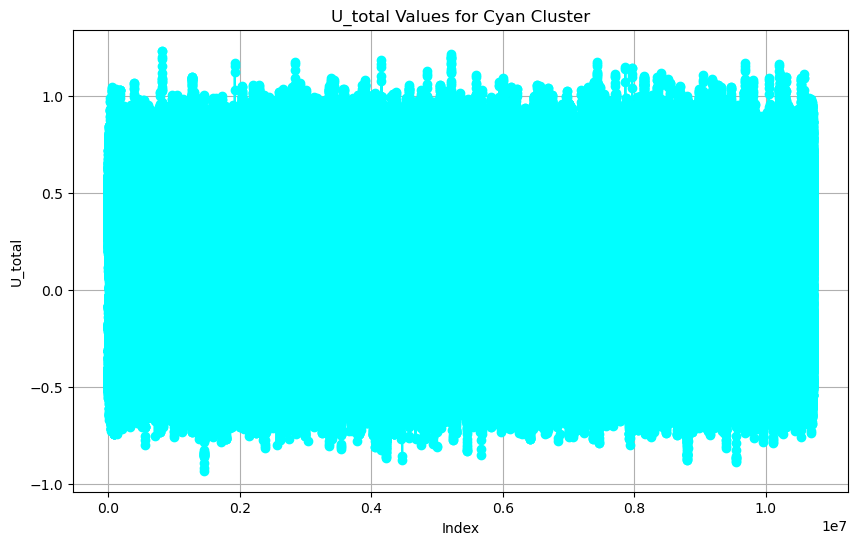

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(cyan_cluster_points.index, cyan_cluster_points['U_total'], linestyle='-', marker='o', color='cyan')
plt.xlabel('Index')
plt.ylabel('U_total')
plt.title('U_total Values for Cyan Cluster')
plt.grid(True)
plt.show()

/home/baasil/anaconda3/envs/simulations_env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


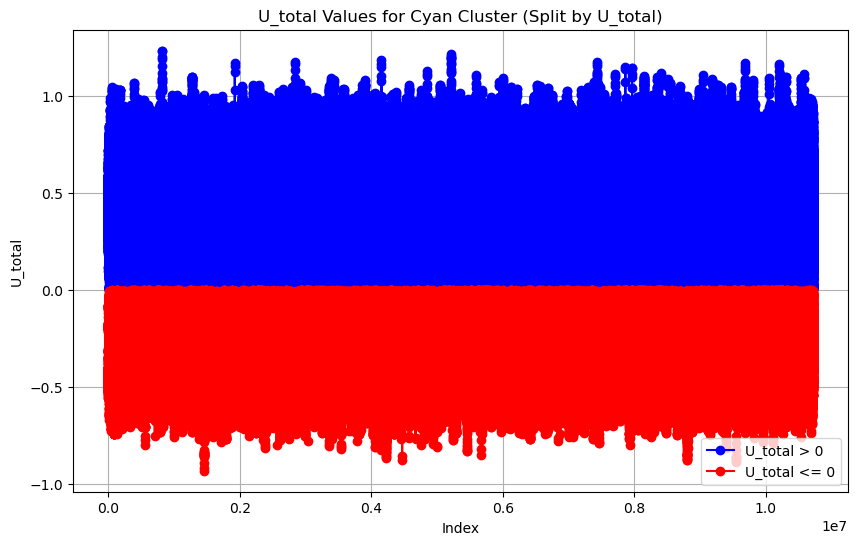

In [ ]:
cyan_cluster_positive = cyan_cluster_points[cyan_cluster_points['U_total'] > 0]
cyan_cluster_non_positive = cyan_cluster_points[cyan_cluster_points['U_total'] <= 0]


plt.figure(figsize=(10, 6))
plt.plot(cyan_cluster_positive.index, cyan_cluster_positive['U_total'], linestyle='-', marker='o', color='blue', label='U_total > 0')
plt.plot(cyan_cluster_non_positive.index, cyan_cluster_non_positive['U_total'], linestyle='-', marker='o', color='red', label='U_total <= 0')
plt.xlabel('Index')
plt.ylabel('U_total')
plt.title('U_total Values for Cyan Cluster (Split by U_total)')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
cyan_cluster_positive.head()

,psi_e_total,b_e_total,psi_plus_total,b_plus_total,U_total,R_total,k_e_psi_e_total,k_e_b_e_total,k_e_psi_plus_total,k_e_b_plus_total,heat_flux_psi_e_b_e_total,heat_flux_psi_e_b_plus_total,b_e_psi_plus_total,b_e_b_plus_total,psi_plus_b_plus_total,eta_total,Cluster
0,0.017451,-4.771906,-0.001943,-3.097217,0.373900,-1.148065,0.000305,22.771086,0.000004,9.592751,-0.083274,-0.054049,0.009272,14.779627,0.006018,-0.109825,1
1,0.017817,-7.059277,-0.001749,-2.887717,0.362477,-1.055088,0.000317,49.833386,0.000003,8.338907,-0.125775,-0.051450,0.012346,20.385190,0.005051,0.314193,1
2,0.015658,-9.108645,-0.001572,-2.521739,0.353207,-0.833608,0.000245,82.967411,0.000002,6.359169,-0.142619,-0.039484,0.014323,22.969627,0.003965,-0.891066,1
3,0.013379,-10.963888,-0.001424,-2.022189,0.345397,-0.645293,0.000179,120.206832,0.000002,4.089250,-0.146690,-0.027056,0.015618,22.171058,0.002881,0.437075,1
4,0.009187,-12.231592,-0.001307,-1.419815,0.340377,-0.406681,0.000084,149.611848,0.000002,2.015875,-0.112368,-0.013043,0.015992,17.366600,0.001856,1.760299,1


In [ ]:
cyan_cluster_non_positive.head()

,psi_e_total,b_e_total,psi_plus_total,b_plus_total,U_total,R_total,k_e_psi_e_total,k_e_b_e_total,k_e_psi_plus_total,k_e_b_plus_total,heat_flux_psi_e_b_e_total,heat_flux_psi_e_b_plus_total,b_e_psi_plus_total,b_e_b_plus_total,psi_plus_b_plus_total,eta_total,Cluster
626,0.013513,11.984727,0.004554,0.795640,-0.507654,2.083664,0.000183,143.633671,0.000021,0.633043,0.161951,0.010752,0.054579,9.535526,0.003623,0.125527,1
633,0.016992,-7.496788,0.002449,5.732550,-0.332424,1.408710,0.000289,56.201837,0.000006,32.862134,-0.127382,0.097405,-0.018357,-42.975717,0.014037,0.748363,1
634,0.010557,-9.435280,0.002057,5.429343,-0.321966,0.735402,0.000111,89.024506,0.000004,29.477766,-0.099606,0.057316,-0.019412,-51.227371,0.011170,-0.097378,1
635,0.005068,-10.633803,0.001685,5.000558,-0.316818,0.289112,0.000026,113.077764,0.000003,25.005581,-0.053895,0.025344,-0.017915,-53.174949,0.008425,-1.155658,1
636,0.003076,-11.291294,0.001341,4.483994,-0.314540,0.139693,0.000009,127.493315,0.000002,20.106206,-0.034731,0.013793,-0.015145,-50.630099,0.006014,1.274385,1


In [ ]:
cyan_cluster_near_zero = cyan_cluster_points[(cyan_cluster_points['U_total'] > -.0001) & (cyan_cluster_points['U_total'] < .0001)]
cyan_cluster_near_zero.head()

,psi_e_total,b_e_total,psi_plus_total,b_plus_total,U_total,R_total,k_e_psi_e_total,k_e_b_e_total,k_e_psi_plus_total,k_e_b_plus_total,heat_flux_psi_e_b_e_total,heat_flux_psi_e_b_plus_total,b_e_psi_plus_total,b_e_b_plus_total,psi_plus_b_plus_total,eta_total,Cluster
181499,-0.018643,-1.512257,0.000590,-0.797911,0.000093,-0.372232,0.000348,2.286922,3.477214e-07,0.636661,0.028194,0.014876,-0.000892,1.206646,-0.000471,1.445036,1
231499,-0.015085,-6.661313,0.001343,-3.165877,0.000088,-0.686104,0.000228,44.373095,1.804334e-06,10.022774,0.100489,0.047759,-0.008948,21.088895,-0.004253,-1.657061,1
418499,0.013678,-1.973721,-0.000490,0.883408,0.000026,-0.226949,0.000187,3.895574,2.401408e-07,0.780410,-0.026997,0.012083,0.000967,-1.743601,-0.000433,1.291665,1
422499,-0.005538,0.150621,0.002545,-2.963599,0.000072,-0.477173,0.000031,0.022687,6.475952e-06,8.782918,-0.000834,0.016412,0.000383,-0.446380,-0.007542,-1.157935,1
588499,0.005919,-3.755512,-0.004351,5.821979,0.000024,-0.871995,0.000035,14.103869,1.893251e-05,33.895440,-0.022228,0.034459,0.016341,-21.864512,-0.025332,1.057168,1
